In [1]:
import xarray as xr
import rioxarray
import geopandas as gpd
import pandas as pd

from shapely.geometry import Polygon, Point, box

In [2]:
%cd ..

c:\Users\javie\Documents\magister\propagacion-incendios


C:\Users\javie\AppData\Roaming\Python\Python311\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
path =  r'data\EEUU\capa_viirs_6m_cuadrado\VNP02IMG_NRT.A2025102.0818.002.2025102105910.nc'

In [4]:
path_VNP03IMG_NRT =  r'data\EEUU\VNP03IMG_NRT\VNP03IMG.A2025102.0818.002.2025102163752.nc'

In [5]:
## con rioxarray
data_nasa = rioxarray.open_rasterio(path)

c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gc

In [6]:
data_nasa

<xarray.Dataset> Size: 414MB
Dimensions:            (band: 1, x: 6400, y: 6464)
Coordinates:
  * band               (band) int64 8B 1
  * x                  (x) float64 51kB 0.5 1.5 2.5 ... 6.398e+03 6.4e+03
  * y                  (y) float64 52kB 0.5 1.5 2.5 ... 6.462e+03 6.464e+03
    spatial_ref        int64 8B 0
Data variables:
    I04                (band, y, x) uint16 83MB ...
    I04_quality_flags  (band, y, x) uint16 83MB ...
    I04_uncert_index   (band, y, x) int8 41MB ...
    I05                (band, y, x) uint16 83MB ...
    I05_quality_flags  (band, y, x) uint16 83MB ...
    I05_uncert_index   (band, y, x) int8 41MB ...
Attributes: (12/62)
    AlgorithmType:                     SCI
    AlgorithmVersion:                  NPP_PR02 v3.0.0
    cdm_data_type:                     swath
    Conventions:                       CF-1.6
    creator_email:                     modis-ops@lists.nasa.gov
    creator_name:                      VIIRS L1 Processing Group
    ...                                ...
    StartTime:                         2025-04-12 08:18:00.000
    time_coverage_end:                 2025-04-12T08:24:00.000Z
    time_coverage_start:               2025-04-12T08:18:00.000Z
    title:                             VIIRS I-band Reflected Solar Band and ...
    VersionId:                         2
    WestBoundingCoordinate:            -115.38496

In [7]:
coords = rioxarray.open_rasterio(path_VNP03IMG_NRT)

c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gc

In [8]:
data_nasa.data_vars

Data variables:
    I04                (band, y, x) uint16 83MB ...
    I04_quality_flags  (band, y, x) uint16 83MB ...
    I04_uncert_index   (band, y, x) int8 41MB ...
    I05                (band, y, x) uint16 83MB ...
    I05_quality_flags  (band, y, x) uint16 83MB ...
    I05_uncert_index   (band, y, x) int8 41MB ...

In [8]:
data_nasa.coords

Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 51kB 0.5 1.5 2.5 ... 6.398e+03 6.398e+03 6.4e+03
  * y            (y) float64 52kB 0.5 1.5 2.5 ... 6.462e+03 6.462e+03 6.464e+03
    spatial_ref  int64 8B 0

In [9]:
data_nasa.I04 * data_nasa.I04.attrs['scale_factor'] 

<xarray.DataArray 'I04' (band: 1, y: 6464, x: 6400)> Size: 331MB
array([[[4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827],
        [4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827],
        [4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827],
        ...,
        [4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827],
        [4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827],
        [4.00048827, 4.00048827, 4.00048827, ..., 4.00048827,
         4.00048827, 4.00048827]]], shape=(1, 6464, 6400))
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 51kB 0.5 1.5 2.5 ... 6.398e+03 6.398e+03 6.4e+03
  * y            (y) float64 52kB 0.5 1.5 2.5 ... 6.462e+03 6.462e+03 6.464e+03
    spatial_ref  int64 8B 0

In [10]:
lat_lon = coords[0][['latitude', 'longitude']].isel(band=0).to_dataframe().reset_index()

In [11]:
data_bandas = data_nasa.isel(band=0).to_dataframe().reset_index()

In [19]:
data_bandas['I04_scale'] = (data_bandas['I04'] * data_nasa.I04.attrs['scale_factor'] )+ data_nasa.I04.attrs['add_offset']

data_bandas['I05_scale'] = (data_bandas['I05'] * data_nasa.I05.attrs['scale_factor'] )+ data_nasa.I05.attrs['add_offset']

In [ ]:
# k1 = data_bandas.variables['I04'].radiance_to_bt_k1
# k2 = data_bandas.variables['I04'].radiance_to_bt_k2
# bt_i04 = (k2 / np.log((k1 / data_bandas['I04_scale']) + 1))  

In [27]:
data_lat_lon = lat_lon.merge(data_bandas, on = ['y', 'x', 'band', 'spatial_ref'], how = 'inner')

In [29]:
data_lat_lon.I04_quality_flags.value_counts()  ## investigar bien esto!!!

I04_quality_flags
0      36041695
256     5326336
2          1568
4             1
Name: count, dtype: int64

In [33]:
data_lat_lon = data_lat_lon.drop(columns = ['band', 'spatial_ref', 'I04_uncert_index', 'I05_uncert_index'],
                                 axis= 1)

In [34]:
gdf = gpd.GeoDataFrame(data_lat_lon, geometry=gpd.points_from_xy(data_lat_lon.longitude,
                                                                 data_lat_lon.latitude), crs="EPSG:4326")


In [38]:
gdf.to_file("data/EEUU/data_geopandas/viirs_A2025102_0818_002_20251021")

C:\Users\javie\AppData\Local\Temp\ipykernel_22144\1344186596.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file("data/EEUU/data_geopandas/viirs_A2025102_0818_002_20251021")
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'I04_quality_flags' to 'I04_qualit'
  ogr_write(
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'I05_quality_flags' to 'I05_qualit'
  ogr_write(
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: 2GB file size limit reached for data/EEUU/data_geopandas/viirs_A2025102_0818_002_20251021\viirs_A2025102_0818_002_20251021.dbf. Going on, but might cause compatibility issues with third party software
  ogr_write(


In [39]:
gdf

,y,x,latitude,longitude,I04,I04_quality_flags,I05,I05_quality_flags,I04_scale,I05_scale,geometry
0,0.5,0.5,31.062057,-115.374283,65535,256,65535,256,4.002159,25.144173,POINT (-115.37428 31.06206)
1,0.5,1.5,31.061914,-115.368713,65535,256,65535,256,4.002159,25.144173,POINT (-115.36871 31.06191)
2,0.5,2.5,31.061764,-115.363060,65535,256,65535,256,4.002159,25.144173,POINT (-115.36306 31.06176)
3,0.5,3.5,31.061579,-115.355690,65535,256,65535,256,4.002159,25.144173,POINT (-115.35569 31.06158)
4,0.5,4.5,31.061378,-115.347733,65535,256,65535,256,4.002159,25.144173,POINT (-115.34773 31.06138)
...,...,...,...,...,...,...,...,...,...,...,...
41369595,6463.5,6395.5,45.531513,-73.036484,65535,256,65535,256,4.002159,25.144173,POINT (-73.03648 45.53151)
41369596,6463.5,6396.5,45.528015,-73.027077,65535,256,65535,256,4.002159,25.144173,POINT (-73.02708 45.52802)
41369597,6463.5,6397.5,45.524490,-73.017593,65535,256,65535,256,4.002159,25.144173,POINT (-73.01759 45.52449)
41369598,6463.5,6398.5,45.520969,-73.008133,65535,256,65535,256,4.002159,25.144173,POINT (-73.00813 45.52097)


In [117]:
areas = {
    "carolina_norte":box(-82.17126, 35.75625, -82.01132, 35.8509), #  box(-82.25418, 35.72955, -82.00592, 35.90865),
    "picker_flats": box(-94.81305, 35.91905, -94.74988, 35.96423),
    "area2": box(-94.90265, 36.26983, -94.85749, 36.30902),
    "haoe_lead": box(-83.97421, 35.34632, -83.91338, 35.39466),
    "bee_rock_creek": box(-82.17802, 35.77566, -82.06976, 35.85195)
}

In [41]:
gdfs_por_area = {}
for nombre, area in areas.items():
    gdf_filtrada = gdf[gdf.geometry.within(area)]
    gdfs_por_area[nombre] = gdf_filtrada

# --- Ejemplo: mostrar la cantidad de puntos por área ---
for nombre, subgdf in gdfs_por_area.items():
    print(f"{nombre}: {len(subgdf)} puntos")

carolina_norte: 1766 puntos
picker_flats: 179 puntos
area2: 107 puntos
haoe_lead: 129 puntos
bee_rock_creek: 334 puntos


In [42]:
gdfs_por_area['carolina_norte']

,y,x,latitude,longitude,I04,I04_quality_flags,I05,I05_quality_flags,I04_scale,I05_scale,geometry
18418922,2877.5,6122.5,35.730190,-82.247551,65535,256,65535,256,4.002159,25.144173,POINT (-82.24755 35.73019)
18425322,2878.5,6122.5,35.736523,-82.245201,65535,256,65535,256,4.002159,25.144173,POINT (-82.2452 35.73652)
18425323,2878.5,6123.5,35.733940,-82.236382,65535,256,65535,256,4.002159,25.144173,POINT (-82.23638 35.73394)
18425324,2878.5,6124.5,35.732407,-82.231178,65535,256,65535,256,4.002159,25.144173,POINT (-82.23118 35.73241)
18425325,2878.5,6125.5,35.730946,-82.226212,65535,256,65535,256,4.002159,25.144173,POINT (-82.22621 35.73095)
...,...,...,...,...,...,...,...,...,...,...,...
18950139,2960.5,6139.5,35.904961,-82.011292,1364,0,14227,0,0.084934,5.569036,POINT (-82.01129 35.90496)
19052536,2976.5,6136.5,35.907375,-82.024727,65535,256,65535,256,4.002159,25.144173,POINT (-82.02473 35.90738)
19052537,2976.5,6137.5,35.905537,-82.018730,65535,256,65535,256,4.002159,25.144173,POINT (-82.01873 35.90554)
19052538,2976.5,6138.5,35.903664,-82.012634,65535,256,65535,256,4.002159,25.144173,POINT (-82.01263 35.90366)


In [47]:
gdfs_por_area['carolina_norte']['I04_scale'].describe()

count    1766.000000
mean        0.957423
std         1.629500
min         0.060455
25%         0.075411
50%         0.082187
75%         0.131128
max         4.002159
Name: I04_scale, dtype: float64

In [ ]:
import contextily as ctx
import matplotlib.pyplot as plt

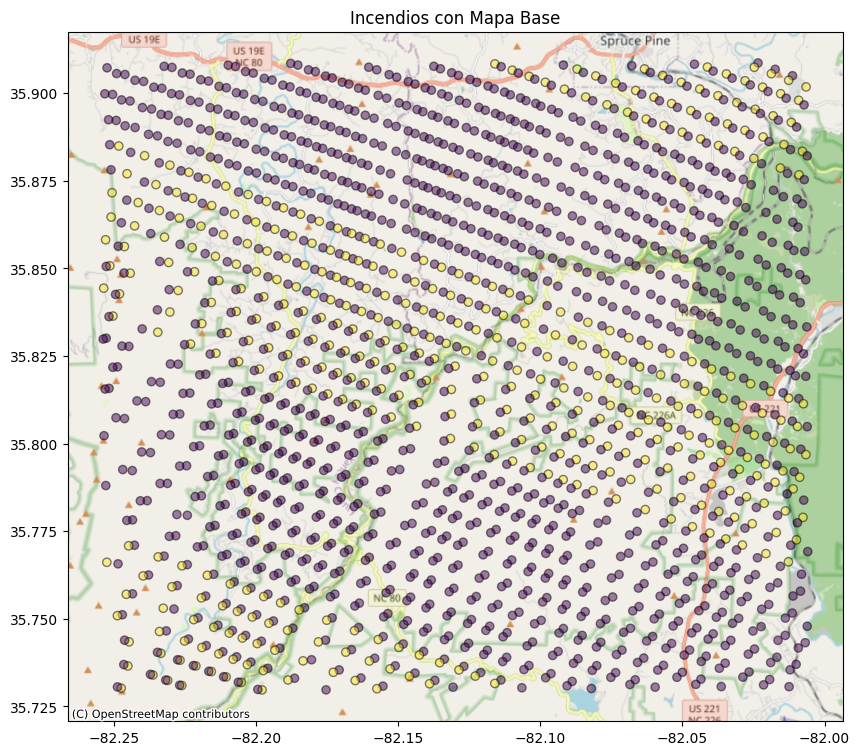

In [52]:
ax = gdfs_por_area['carolina_norte'].plot(figsize=(10, 10), alpha=0.5, edgecolor="k", column = 'I04')
ctx.add_basemap(ax, crs=gdfs_por_area['carolina_norte'].crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
plt.title("Incendios con Mapa Base")
plt.show()

In [53]:
def cambiar_fecha(df):
    df['acq_datetime'] = pd.to_datetime(df['ACQ_DATE'].astype(str) + ' ' + df['ACQ_TIME'].astype(str).str.zfill(4), format='%Y-%m-%d %H%M')
    return df


In [59]:
## load FIRMS VP04

path_landsat = r'data\EEUU\190425-2221\DL_FIRE_LS_604424\fire_nrt_LS_604424.shp'
path_Modis = r'data\EEUU\190425-2221\DL_FIRE_M-C61_604423\fire_nrt_M-C61_604423.shp'
path_j1 = r'data\EEUU\190425-2221\DL_FIRE_J1V-C2_604425\fire_nrt_J1V-C2_604425.shp'   # J1 VIIRS C2
path_j2 = r'data\EEUU\190425-2221\DL_FIRE_J2V-C2_604426\fire_nrt_J2V-C2_604426.shp'   # J2 VIIRS C2
path_sv = r'data\EEUU\190425-2221\DL_FIRE_SV-C2_604427\fire_nrt_SV-C2_604427.shp'     # SUOMI VIIRS C2


SUOMI = cambiar_fecha(gpd.read_file(path_sv))
j1 = cambiar_fecha(gpd.read_file(path_j1))
j2 = cambiar_fecha(gpd.read_file(path_j2))
modis = cambiar_fecha(gpd.read_file(path_Modis))


todos =  pd.concat([SUOMI, j1, j2, modis]).reset_index(drop = True)

In [60]:
todos

,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,geometry,acq_datetime
0,46.51888,-84.37795,303.88,0.58,0.52,2025-04-11,0657,N,VIIRS,n,2.0NRT,271.44,1.92,N,POINT (-84.37795 46.51888),2025-04-11 06:57:00
1,46.51493,-84.39389,308.33,0.58,0.52,2025-04-11,0657,N,VIIRS,n,2.0NRT,270.76,2.09,N,POINT (-84.39389 46.51493),2025-04-11 06:57:00
2,39.97911,-86.83656,295.10,0.33,0.56,2025-04-11,0659,N,VIIRS,n,2.0NRT,275.41,0.96,N,POINT (-86.83656 39.97911),2025-04-11 06:59:00
3,35.89014,-89.78234,321.42,0.45,0.63,2025-04-11,0659,N,VIIRS,n,2.0NRT,280.70,1.81,N,POINT (-89.78234 35.89014),2025-04-11 06:59:00
4,39.60941,-79.91908,312.90,0.46,0.39,2025-04-11,0659,N,VIIRS,n,2.0NRT,277.22,2.02,N,POINT (-79.91908 39.60941),2025-04-11 06:59:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57452,42.68881,-111.59776,310.34,3.66,1.79,2025-04-19,2220,Aqua,MODIS,54,6.1NRT,293.30,47.51,D,POINT (-111.59776 42.68881),2025-04-19 22:20:00
57453,41.53367,-123.65819,306.04,1.00,1.00,2025-04-19,2220,Aqua,MODIS,40,6.1NRT,295.11,4.86,D,POINT (-123.65819 41.53367),2025-04-19 22:20:00
57454,39.32202,-123.18787,312.47,1.01,1.00,2025-04-19,2220,Aqua,MODIS,60,6.1NRT,297.41,6.68,D,POINT (-123.18787 39.32202),2025-04-19 22:20:00
57455,45.45843,-123.07542,303.39,1.04,1.02,2025-04-19,2222,Aqua,MODIS,50,6.1NRT,291.03,4.75,D,POINT (-123.07542 45.45843),2025-04-19 22:22:00


In [61]:
subset = todos[todos.geometry.within(areas['carolina_norte'])]

In [ ]:
fire_bounds = subset.total_bounds  
buffer_deg = 0.009 * 3  ## 3km

grilla_bounds = (
    fire_bounds[0] - buffer_deg, fire_bounds[1] - buffer_deg,
    fire_bounds[2] + buffer_deg, fire_bounds[3] + buffer_deg
)

In [116]:
grilla_bounds

(np.float64(-82.17126),
 np.float64(35.75625),
 np.float64(-82.01132),
 np.float64(35.8509))

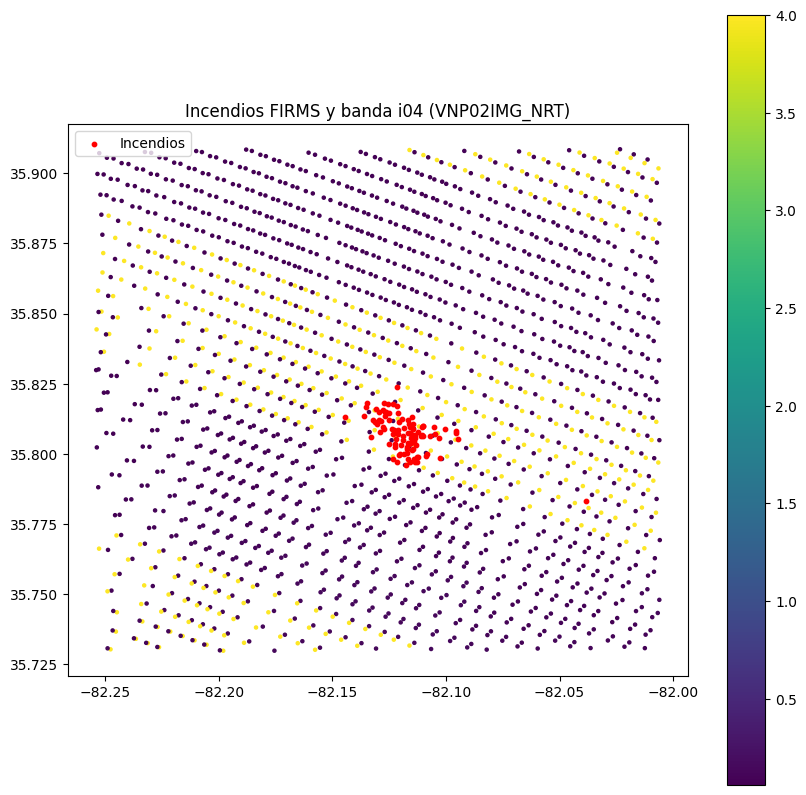

In [78]:
fig, ax = plt.subplots(figsize=(10, 10))

gdfs_por_area['carolina_norte'].plot(column="I04_scale", ax=ax, cmap="viridis", legend=True, markersize=5)
subset.plot(ax=ax, color="red", markersize=10, label="Incendios")

plt.legend()
plt.title("Incendios FIRMS y banda i04 (VNP02IMG_NRT)")
plt.show()

In [54]:
gdfs_por_area['carolina_norte']

,y,x,latitude,longitude,I04,I04_quality_flags,I05,I05_quality_flags,I04_scale,I05_scale,geometry
18418922,2877.5,6122.5,35.730190,-82.247551,65535,256,65535,256,4.002159,25.144173,POINT (-82.24755 35.73019)
18425322,2878.5,6122.5,35.736523,-82.245201,65535,256,65535,256,4.002159,25.144173,POINT (-82.2452 35.73652)
18425323,2878.5,6123.5,35.733940,-82.236382,65535,256,65535,256,4.002159,25.144173,POINT (-82.23638 35.73394)
18425324,2878.5,6124.5,35.732407,-82.231178,65535,256,65535,256,4.002159,25.144173,POINT (-82.23118 35.73241)
18425325,2878.5,6125.5,35.730946,-82.226212,65535,256,65535,256,4.002159,25.144173,POINT (-82.22621 35.73095)
...,...,...,...,...,...,...,...,...,...,...,...
18950139,2960.5,6139.5,35.904961,-82.011292,1364,0,14227,0,0.084934,5.569036,POINT (-82.01129 35.90496)
19052536,2976.5,6136.5,35.907375,-82.024727,65535,256,65535,256,4.002159,25.144173,POINT (-82.02473 35.90738)
19052537,2976.5,6137.5,35.905537,-82.018730,65535,256,65535,256,4.002159,25.144173,POINT (-82.01873 35.90554)
19052538,2976.5,6138.5,35.903664,-82.012634,65535,256,65535,256,4.002159,25.144173,POINT (-82.01263 35.90366)


In [55]:
subset.crs

NameError: name 'subset' is not defined

In [57]:
gdfs_por_area['carolina_norte'].crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [62]:

# Explorar la capa i04 con color según el valor
m = gdfs_por_area['carolina_norte'].explore(
    column="I04_scale",  
    cmap="viridis",
    legend=True,
    name="Banda i04",
    marker_kwds={"radius": 3},
)

# Añadir la capa de incendios encima
subset.explore(
    m=m,
    color= plt.cm.OrRd,
    marker_kwds={"radius": 4},
    name="Incendios FIRMS",
    column = 'acq_datetime'
)


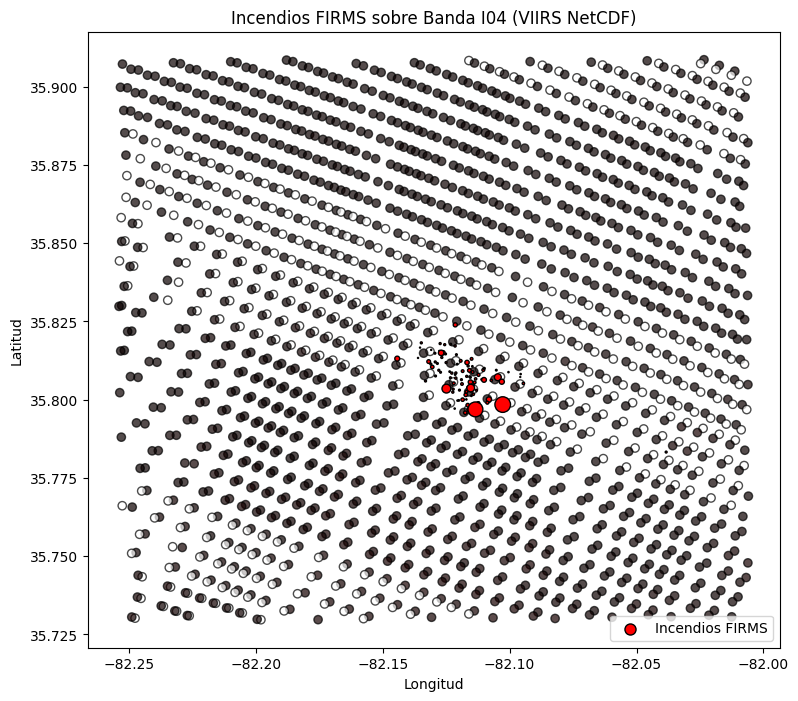

In [63]:
fig, ax = plt.subplots(figsize=(12, 8))


gdfs_por_area['carolina_norte'].plot(ax=ax, cmap='hot', alpha=0.7,column= 'I04_scale', edgecolor="k")

# Plot puntos de FIRMS
subset.plot(
    ax=ax,
    color='red',
    markersize=subset['FRP'],  # Tamaño proporcional al FRP
    edgecolor='black',
    label='Incendios FIRMS'
)

# Añadir detalles
ax.set_title("Incendios FIRMS sobre Banda I04 (VIIRS NetCDF)")
ax.set_xlabel("Longitud")
ax.set_ylabel("Latitud")
plt.legend()
plt.show()

In [66]:
path =  r'data\EEUU\capa_viirs_6m_cuadrado\VNP02IMG_NRT.A2025105.1842.002.2025105213757.nc'
path_VNP03IMG_NRT =  r'data\EEUU\VNP03IMG_NRT\VNP03IMG.A2025105.1842.002.2025106015043.nc'

In [67]:
coords = rioxarray.open_rasterio(path_VNP03IMG_NRT)
data_nasa = rioxarray.open_rasterio(path)
lat_lon = coords[0][['latitude', 'longitude']].isel(band=0).to_dataframe().reset_index()
data_bandas = data_nasa.isel(band=0).to_dataframe().reset_index()
data_bandas['I04_scale'] = (data_bandas['I04'] * data_nasa.I04.attrs['scale_factor'] )+ data_nasa.I04.attrs['add_offset']
data_bandas['I05_scale'] = (data_bandas['I05'] * data_nasa.I05.attrs['scale_factor'] )+ data_nasa.I05.attrs['add_offset']

data_lat_lon = lat_lon.merge(data_bandas, on = ['y', 'x', 'band', 'spatial_ref'], how = 'inner')
data_lat_lon = data_lat_lon.drop(columns = ['band', 'spatial_ref', 'I04_uncert_index', 'I05_uncert_index'],
                                 axis= 1)
gdf = gpd.GeoDataFrame(data_lat_lon, geometry=gpd.points_from_xy(data_lat_lon.longitude,
                                                                 data_lat_lon.latitude), crs="EPSG:4326")

c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gc

In [68]:
gdfs_por_area2 = {}
for nombre, area in areas.items():
    gdf_filtrada = gdf[gdf.geometry.within(area)]
    gdfs_por_area2[nombre] = gdf_filtrada


In [69]:
gdfs_por_area2['carolina_norte'].explore(
    column="I04_scale",  
    cmap= 'viridis',
    marker_kwds={"radius": 4})

In [70]:
m = gdfs_por_area2['carolina_norte'].explore(
    column="I04_scale",  
    cmap= 'viridis',
    legend=True,
    name="Banda i04",
    marker_kwds={"radius": 3},
)

# Añadir la capa de incendios encima
subset.explore(
    m=m,
    color= plt.cm.OrRd,
    marker_kwds={"radius": 4},
    name="Incendios FIRMS",
    column = 'acq_datetime'
)


In [71]:
path =  r'data\EEUU\capa_viirs_6m_cuadrado\VNP02IMG_NRT.A2025106.0706.002.2025106094228.nc'
path_VNP03IMG_NRT =  r'data\EEUU\VNP03IMG_NRT\VNP03IMG.A2025106.0706.002.2025106140645.nc'

In [108]:
data_nasa.I04.attrs['scale_factor']

6.104353815317154e-05

In [109]:
data_nasa.I04.attrs['add_offset']

0.0016703000292181969

In [72]:
coords = rioxarray.open_rasterio(path_VNP03IMG_NRT)
data_nasa = rioxarray.open_rasterio(path)
lat_lon = coords[0][['latitude', 'longitude']].isel(band=0).to_dataframe().reset_index()
data_bandas = data_nasa.isel(band=0).to_dataframe().reset_index()
data_bandas['I04_scale'] = (data_bandas['I04'] * data_nasa.I04.attrs['scale_factor'] )+ data_nasa.I04.attrs['add_offset']
data_bandas['I05_scale'] = (data_bandas['I05'] * data_nasa.I05.attrs['scale_factor'] )+ data_nasa.I05.attrs['add_offset']

data_lat_lon = lat_lon.merge(data_bandas, on = ['y', 'x', 'band', 'spatial_ref'], how = 'inner')
data_lat_lon = data_lat_lon.drop(columns = ['band', 'spatial_ref', 'I04_uncert_index', 'I05_uncert_index'],
                                 axis= 1)
gdf = gpd.GeoDataFrame(data_lat_lon, geometry=gpd.points_from_xy(data_lat_lon.longitude,
                                                                 data_lat_lon.latitude), crs="EPSG:4326")

c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  warnings.warn(str(rio_warning.message), type(rio_warning.message))  # type: ignore
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
c:\Users\javie\AppData\Local\Programs\Python\Python311\Lib\site-packages\rioxarray\_io.py:1143: NotGeoreferencedWarning: Dataset has no geotransform, gc

In [118]:
gdfs_por_area3 = {}
for nombre, area in areas.items():
    gdf_filtrada = gdf[gdf.geometry.within(area)]
    gdfs_por_area3[nombre] = gdf_filtrada

In [119]:
gdfs_por_area3['carolina_norte'].explore(
    column="I04_scale",  
    cmap= 'viridis',
    marker_kwds={"radius": 4})

In [120]:
m = gdfs_por_area3['carolina_norte'].explore(
    column="I04_scale",  
    cmap= 'viridis',
    legend=True,
    name="Banda i04",
    marker_kwds={"radius": 3},
)

# Añadir la capa de incendios encima
subset.explore(
    m=m,
    color= plt.cm.OrRd,
    marker_kwds={"radius": 4},
    name="Incendios FIRMS",
    column = 'acq_datetime'
)
